<a href="https://colab.research.google.com/github/ipeirotis/autoencoders_census/blob/main/Autoencoder_YRBSS%20(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Autoencoders and Data Quality for Tabular Data**

In [102]:
!rm -rf autoencoders_census
!git clone https://github.com/ipeirotis/autoencoders_census.git
%cd autoencoders_census

Cloning into 'autoencoders_census'...
remote: Enumerating objects: 296, done.
remote: Counting objects: 100% (173/173), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 296 (delta 103), reused 124 (delta 72), pack-reused 123
Receiving objects: 100% (296/296), 18.13 MiB | 19.08 MiB/s, done.
Resolving deltas: 100% (169/169), done.
/content/autoencoders_census/autoencoders_census/autoencoders_census


In [103]:
from google.colab import auth

# Login using the account that has access to the Google project
# in order to access the resources for the project
auth.authenticate_user()

In [ ]:
# This code imports the DataTransformer object from
# the notebook pandas2vector.ipynb
!pip install -q import_ipynb keras-tuner
import import_ipynb
from pandas2vector import Table2Vector
from data_loader import DataLoader, DataLoader_2015
from autoencoder import AutoencoderModel
from autoencoder import VariationalAutoencoderModel

# Data Source

The used data stems from the Youth Risk Behavior Surveillance System by CDC (Centers for Disease Control and Prevention). It includes data on a set of surveys that track behaviors that can lead to poor health in students grades 9 through 12. [Here](https://www.cdc.gov/healthyyouth/data/yrbs/data.htm) is the link to the dataset.

Note: The dataset is updated every two years. We use the 2017 version of the national high school YRBS dataset.

## Libraries

In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [95]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import confusion_matrix
from pandas.api.types import is_numeric_dtype
from matplotlib.offsetbox import TransformedBbox

In [96]:
from statsmodels.distributions.empirical_distribution import ECDF
from scipy.interpolate import interp1d
from numpy.random import uniform
from numpy.random import seed

In [97]:
from keras.layers import Input
from keras.layers import Dense
from keras.layers import BatchNormalization
from keras import backend as K
from keras import Model

In [98]:
import tensorflow as tf
from tensorflow.random import set_seed
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow import keras

# Load Original Dataset

In [99]:
# Data Source
data_loader = DataLoader()
original_df = data_loader.load_original_data()
project_data, var_types = data_loader.prepare_original_dataset(original_df)

print(f"Shape of original data: {original_df.shape}")
print(f"Shape of data set we analyze: {project_data.shape}")

Shape of original data: (14765, 305)
Shape of data set we analyze: (14765, 108)


Load 2015 dataset

In [ ]:
data2015 = pd.read_csv("sadc_2015only_national.csv")
data_loader_2015 = DataLoader_2015()
original_df_2015 = data_loader_2015.load_original_data()
project_data_2015, var_types_2015 = data_loader.prepare_original_dataset(original_df)

print(f"Shape of original data: {original_df.shape}")
print(f"Shape of data set we analyze: {project_data.shape}")

Switch the loss metric into the 'sparse categorical cross-entropy'; change the encoding to LabelEncoder for categorical variables;

custom loss function that uses MSE for numeric attributes

In [69]:
data_loader = DataLoader()
original_df1 = data_loader.load_original_data()
project_data1, var_types = data_loader.prepare_original_dataset(original_df)

In [70]:
numeric_vars = [column for column, data_type in var_types.items() if data_type == 'numeric']
categorical_vars = [column for column, data_type in var_types.items() if data_type == 'categorical']

numeric_data = project_data[numeric_vars]
categorical_data = project_data[categorical_vars]

In [ ]:
# Vectorize the data set (integer-based encoding for categorical columns)
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
for column in categorical_data.columns:
    categorical_data[column] = label_encoder.fit_transform(categorical_data[column])

In [72]:
scaler = MinMaxScaler()
numerical_data_scaled = scaler.fit_transform(numeric_data)

In [79]:
categorical_df = pd.DataFrame(categorical_data, columns=categorical_vars)
numerical_df = pd.DataFrame(numerical_data_scaled, columns=numeric_vars)
combined_df = pd.concat([numerical_df, categorical_df], axis=1)

In [74]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy, MeanSquaredError

train_data, val_data = train_test_split(combined_df, test_size=0.2, random_state=42)
train_data = train_data.dropna()
val_data = val_data.dropna()
input_shape = train_data.shape[1:]
numeric_vars = ["weight", "stheight", "stweight", "bmi", "bmipct"]
categorical_vars = [c for c in train_data.columns if c not in numeric_vars]
categorical_columns = [column for column, data_type in var_types.items() if data_type == 'categorical']
numeric_columns = [column for column, data_type in var_types.items() if data_type == 'numeric']

column_ranges = {}
start = len(numeric_columns)
for col in categorical_columns:
    dummies = pd.get_dummies(combined_df[col], prefix=col)
    combined_df = pd.concat([combined_df, dummies], axis=1)
    combined_df.drop(columns=[col], inplace=True)
    end = start + dummies.shape[1]
    column_ranges[col] = (start, end)
    start = end

var_types = {column: ('numeric' if column in numeric_vars else 'categorical') for column in train_data.columns}
d = 5

def build_encoder(hp):
    inputs = Input(shape=input_shape)
    x = Dense(units=hp.Int('encoder_units_1', min_value=32, max_value=256, step=32), activation='relu')(inputs)
    x = Dense(units=hp.Int('encoder_units_2', min_value=16, max_value=128, step=16), activation='relu')(x)
    latent_space = Dense(units=d, activation='relu')(x)
    encoder = Model(inputs, latent_space)
    return encoder

def build_decoder(hp):
    decoder_inputs = Input(shape=(d,))
    x = Dense(units=hp.Int('decoder_units_1', min_value=16, max_value=128, step=16), activation='relu')(decoder_inputs)
    x = Dense(units=hp.Int('decoder_units_2', min_value=32, max_value=256, step=32), activation='relu')(x)
    outputs = Dense(units=input_shape[0], activation='linear')(x)
    decoder = Model(decoder_inputs, outputs)
    return decoder


from keras import backend as K

def custom_loss(y_true, y_decoded):

    y_true_numeric = y_true[:, :len(numeric_columns)]
    y_decoded_numeric = y_decoded[:, :len(numeric_columns)]
    numeric_loss = K.mean(K.binary_crossentropy(y_true_numeric, y_decoded_numeric), axis=-1)

    categorical_losses = []
    for col, (start, end) in column_ranges.items():
        y_true_categorical = y_true[:, start:end]
        y_decoded_categorical = y_decoded[:, start:end]
        loss = K.mean(K.categorical_crossentropy(y_true_categorical, y_decoded_categorical), axis=-1)
        categorical_losses.append(loss)

    return numeric_loss + K.sum(categorical_losses)


def build_autoencoder(hp):
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    batch_size = hp.Int('batch_size', min_value=16, max_value=128, step=16)
    autoencoder_input = Input(shape=input_shape)
    encoder_output = build_encoder(hp)(autoencoder_input)
    decoder_output = build_decoder(hp)(encoder_output)

    #categorical_columns = [column for column, data_type in var_types.items() if data_type == 'categorical']
    #numeric_columns = [column for column, data_type in var_types.items() if data_type == 'numeric']

    #categorical_loss = SparseCategoricalCrossentropy(from_logits=True)
    #categorical_loss_value = categorical_loss(autoencoder_input[:, len(numeric_columns):], decoder_output[:, len(numeric_columns):])

    #numeric_loss = MeanSquaredError()
    #numeric_loss_value = numeric_loss(autoencoder_input[:, :len(numeric_columns)], decoder_output[:, :len(numeric_columns)])

    #overall_loss = categorical_loss_value + numeric_loss_value

    autoencoder = Model(autoencoder_input, decoder_output)
    autoencoder.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss=custom_loss)

    return autoencoder

In [75]:
from kerastuner.tuners import RandomSearch

tuner = RandomSearch(
    build_autoencoder,
    objective='val_loss',
    max_trials=5,
    executions_per_trial=3,
    directory='my_dir',
    project_name='HDHyperparameter',
    overwrite=True,
    seed=42)

tuner.search(train_data, train_data, epochs=10, batch_size=32, validation_data=(val_data, val_data))

best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
final_model = build_autoencoder(best_hps)

#train_loss1 = []
#val_loss1 = []

#history1 = final_model.fit(train_data, train_data,
                          #epochs=10,
                          #batch_size=32,
                          #verbose=1,
                          #validation_data=(val_data, val_data))

Trial 5 Complete [00h 10m 59s]
val_loss: nan

Best val_loss So Far: 1454.4432779947917
Total elapsed time: 00h 53m 02s


In [84]:
reconstructed_data = final_model.predict(combined_df)
reconstructed_data_crossentropy = pd.DataFrame(reconstructed_data, columns=combined_df.columns, index=combined_df.index)
reconstructed_data_crossentropy.sample(10)

462/462 [==============================] - 2s 4ms/step


,weight,stheight,stweight,bmi,bmipct,age,sex,grade,Hispanic_or_Latino,race,...,drive_when_using_marijuana,ever_used_LSD,sports_drinks,plain_water,food_allergies,muscle_stregthening,indoor_tanning,sunburn,difficulty_concentrating,how_well_speak_English
7517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7644,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9137,0.010058,-0.025197,0.001647,-0.057445,-0.017291,0.023582,0.012613,-0.051161,-0.013291,0.038805,...,0.048788,-0.006665,0.012856,-0.031540,0.034133,0.020389,-0.031073,0.000074,0.030872,-0.000477
6224,0.040652,-0.033533,0.025462,0.005214,-0.014380,0.027637,0.009942,-0.051720,0.016952,0.033179,...,0.026069,0.005159,-0.058079,-0.013489,0.029665,0.000792,-0.037574,-0.026271,0.015539,0.034732
2569,0.021714,-0.054396,0.003557,-0.124015,-0.037328,0.050910,0.027230,-0.110449,-0.028693,0.083774,...,0.105326,-0.014388,0.027755,-0.068091,0.073688,0.044017,-0.067083,0.000160,0.066649,-0.001031
12471,0.012636,-0.031654,0.002070,-0.072167,-0.021722,0.029626,0.015846,-0.064273,-0.016697,0.048750,...,0.061292,-0.008373,0.016151,-0.039624,0.042881,0.025615,-0.039037,0.000093,0.038785,-0.000600
8873,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
13225,0.001524,-0.002235,0.001526,0.000674,-0.000164,0.000993,-0.000855,-0.002110,0.000621,0.001415,...,0.000920,0.000313,-0.002787,0.000380,0.001651,0.000746,-0.001226,-0.001385,0.000633,0.001103
14527,0.128121,-0.187313,0.279698,-0.175591,-0.006503,0.199987,-0.123638,-0.107416,-0.039976,0.115847,...,0.141313,0.161508,0.131129,0.038572,0.118510,0.095235,-0.330982,-0.270685,-0.152128,0.112577
7422,0.001773,-0.004441,0.000290,-0.010126,-0.003048,0.004157,0.002223,-0.009018,-0.002343,0.006840,...,0.008600,-0.001175,0.002266,-0.005560,0.006017,0.003594,-0.005477,0.000013,0.005442,-0.000084


In [83]:
num_rows_with_nan = reconstructed_data_crossentropy.isna().any(axis=1).sum()
num_rows_with_nan

1619

The way to reverse back the dataframe with label encoder??

# Vectorizing the data set

In [40]:
# Data Transformation
vectorizer = Table2Vector(var_types)

# Vectorizing *without* indicator variables for missingness
vectorized_df = vectorizer.vectorize_table(project_data)

vectorized_df.shape

(14765, 563)

In [41]:
assert( vectorizer.tabularize_vector(vectorized_df).shape == project_data.shape )

# Autoencoder loading

In [42]:
from tensorflow.keras.models import load_model
import gcsfs

# Define the path to the file on GCS
gcs_model_path = "gs://autoencoder_census_models/best_parameters_autoencoder.h5"

# Define the local path where the model will be downloaded
local_model_path = "best_parameters_autoencoder.h5"

# Create a GCS filesystem object using your project ID
fs = gcsfs.GCSFileSystem(project='autoencoder-census')

# Download the model file from GCS
with fs.open(gcs_model_path, 'rb') as gcs_file:
    with open(local_model_path, 'wb') as local_file:
        local_file.write(gcs_file.read())

# Load the model from the local file
model = load_model(local_model_path)


## Making Predictions and Filling in the Missing Values


In [43]:
import numpy as np

# Fill the missing values with some initial guess. Here, the median of each column is used.
filled = vectorized_df.fillna(vectorized_df.median())

# Define a condition for stopping the iteration
epsilon = 1e-4
old_filled = None

while old_filled is None or np.abs(filled - old_filled).sum().sum() > epsilon:
  # Save the old filled DataFrame for convergence check
  old_filled = filled.copy()

  # Run the data through the autoencoder, which will return a complete version of the data.
  predicted = model.predict(filled)

  # Replace the initially guessed values in the original data with the corresponding values from the autoencoder's output. But keep the observed values unchanged.
  mask = vectorized_df.isna()
  filled[mask] = np.where(mask, predicted, filled)


462/462 [==============================] - 1s 2ms/step


In [44]:
filled

,weight,stheight,stweight,bmi,bmipct,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,...,sunburn__2 times,sunburn__3 times,sunburn__4 times,sunburn__5 or more times,difficulty_concentrating__No,difficulty_concentrating__Yes,how_well_speak_English__Not at all,how_well_speak_English__Not well,how_well_speak_English__Very well,how_well_speak_English__Well
0,0.508875,0.587383,0.303695,0.108749,0.656014,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.347927,0.454057,0.275584,0.122809,0.673284,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.142144,0.414373,0.250520,0.110779,0.653784,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.161873,0.658366,0.323913,0.101454,0.611447,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.415955,0.454114,0.248274,0.115395,0.623534,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14760,0.018136,0.537631,0.282137,0.103367,0.647649,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14761,0.030378,0.741739,0.429419,0.121699,0.424226,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14762,0.021987,0.670679,0.388659,0.117144,0.483297,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14763,0.087971,0.577465,0.188926,0.082226,0.089027,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Variational Autoencoder

In [45]:
filled_data = filled.values

train_data, val_data = train_test_split(filled_data, test_size=0.2, random_state=42)

In [48]:
from kerastuner.tuners import RandomSearch

vae_model = VariationalAutoencoderModel()

tuner = RandomSearch(
    lambda hp: vae_model.build_autoencoder(hp, input_shape=(563,)),
    objective='val_loss',
    max_trials=5,
    executions_per_trial=1,
    directory='tuning_results',
    project_name='vae_hyperparameter_tuning',
    overwrite=True
)

tuner.search(train_data, train_data, epochs=10, validation_data=(val_data, val_data), batch_size=32)

best_hyperparameters = tuner.get_best_hyperparameters()[0]

Trial 5 Complete [00h 00m 44s]
val_loss: 0.28795257210731506

Best val_loss So Far: 0.07112506031990051
Total elapsed time: 00h 06m 13s


In [ ]:
filled_data = filled.values

train_data, val_data = train_test_split(filled_data, test_size=0.2, random_state=42)

best_model = vae_model.build_autoencoder(best_hyperparameters, input_shape=(563,))

epochs = 10
batch_size = 32
history = best_model.fit(train_data, train_data, batch_size=batch_size, epochs=epochs, validation_data=(val_data, val_data))
best_model.save('best_vae_model.h5')

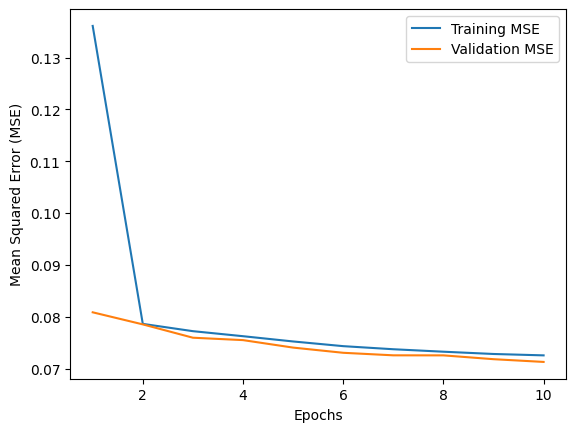

In [50]:
train_mse = history.history['loss']
val_mse = history.history['val_loss']

plt.plot(range(1, epochs+1), train_mse, label='Training MSE')
plt.plot(range(1, epochs+1), val_mse, label='Validation MSE')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error (MSE)')
plt.legend()
plt.show()

In [51]:
#trained_model = keras.models.load_model('best_vae_model.h5')
reconstructed_data_vae = best_model.predict(filled_data)
filled_reconstructed_vae = pd.DataFrame(reconstructed_data_vae, columns=filled.columns, index=filled.index)
filled_reconstructed_vae

462/462 [==============================] - 1s 2ms/step


,weight,stheight,stweight,bmi,bmipct,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,...,sunburn__2 times,sunburn__3 times,sunburn__4 times,sunburn__5 or more times,difficulty_concentrating__No,difficulty_concentrating__Yes,how_well_speak_English__Not at all,how_well_speak_English__Not well,how_well_speak_English__Very well,how_well_speak_English__Well
0,0.244679,0.572997,0.289996,0.095684,0.595616,0.004221,0.014340,0.040500,0.155603,0.346143,...,0.093690,0.098401,0.016424,0.001421,0.719969,0.091424,-0.009391,-0.003290,0.586445,0.170917
1,0.239799,0.474712,0.256752,0.120645,0.697934,-0.000806,-0.007955,0.259325,0.389168,0.240614,...,0.080099,0.032556,0.053269,0.156929,0.599066,0.302850,0.006705,0.054718,0.721140,0.153841
2,0.204778,0.445765,0.268901,0.116795,0.662950,0.008466,-0.002399,0.059150,0.211432,0.343523,...,0.124950,0.087885,0.042434,0.062191,0.327760,0.435351,-0.001267,0.002614,0.624832,0.120719
3,0.179914,0.504750,0.285634,0.106066,0.652076,0.016030,-0.014115,0.033584,0.140367,0.333740,...,0.160228,0.083027,0.019602,0.049487,0.283002,0.415964,-0.006931,0.016443,0.540222,0.137481
4,0.236959,0.468475,0.254282,0.104547,0.586207,0.001597,-0.002738,0.142131,0.309403,0.301486,...,0.072378,0.033164,0.040190,0.102227,0.505144,0.239508,0.010243,0.033235,0.617464,0.126157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14760,0.015552,0.472647,0.264929,0.106855,0.580955,0.097051,0.001800,0.328466,0.083833,0.037662,...,0.059189,-0.009115,-0.054794,-0.002998,-0.132033,0.237139,0.020029,-0.023031,-0.005156,0.025937
14761,0.073572,0.477959,0.280759,0.102686,0.550245,0.081817,-0.001108,0.223470,0.095006,0.074426,...,0.096247,0.013930,-0.054769,0.051088,-0.050862,0.331482,0.054532,-0.000529,0.118918,0.059654
14762,0.102846,0.438090,0.261466,0.111554,0.534626,0.083463,0.006512,0.215605,0.109300,0.073468,...,0.101108,0.021654,-0.037158,0.063380,-0.078218,0.353123,0.060645,0.008534,0.085063,0.054441
14763,0.069105,0.500977,0.274204,0.104092,0.625408,0.047579,0.004148,0.324772,0.142323,0.186680,...,0.037662,0.008928,-0.043741,-0.011775,-0.046398,0.175301,-0.018811,-0.015482,0.063759,-0.005501


In [52]:

tabular_from_predicted_vae = vectorizer.tabularize_vector(filled_reconstructed_vae)

Visualization of the original vs. constructed (variational autoencoder model)

weight


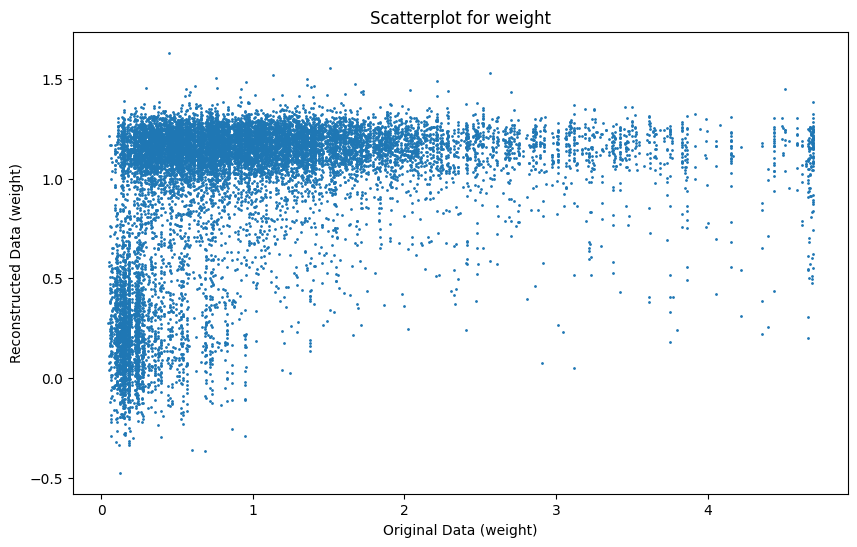

stheight


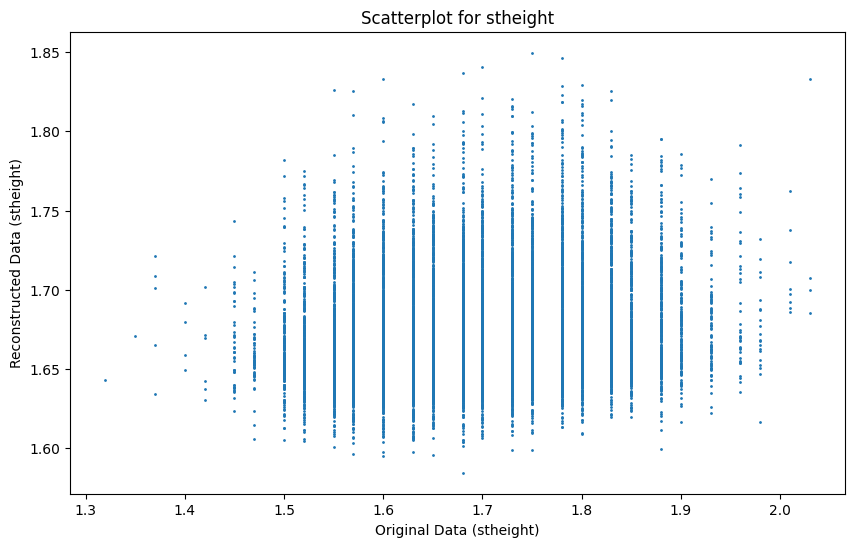

stweight


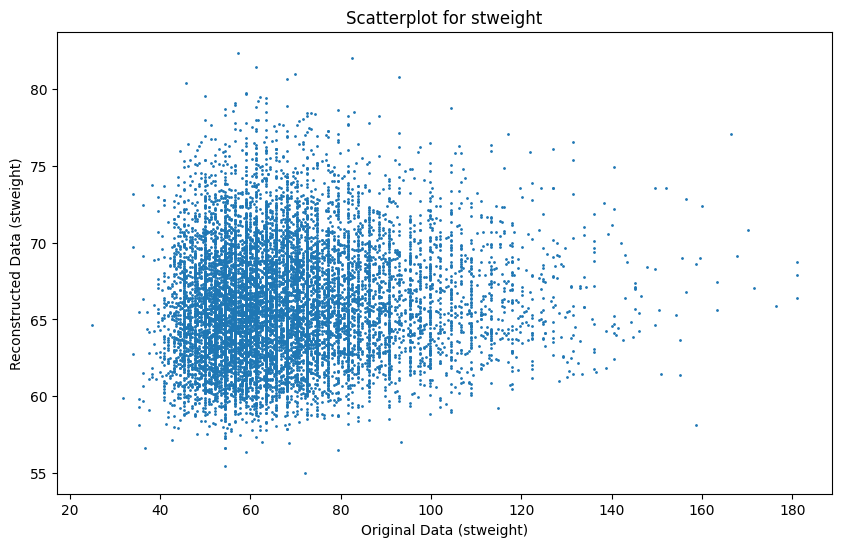

bmi


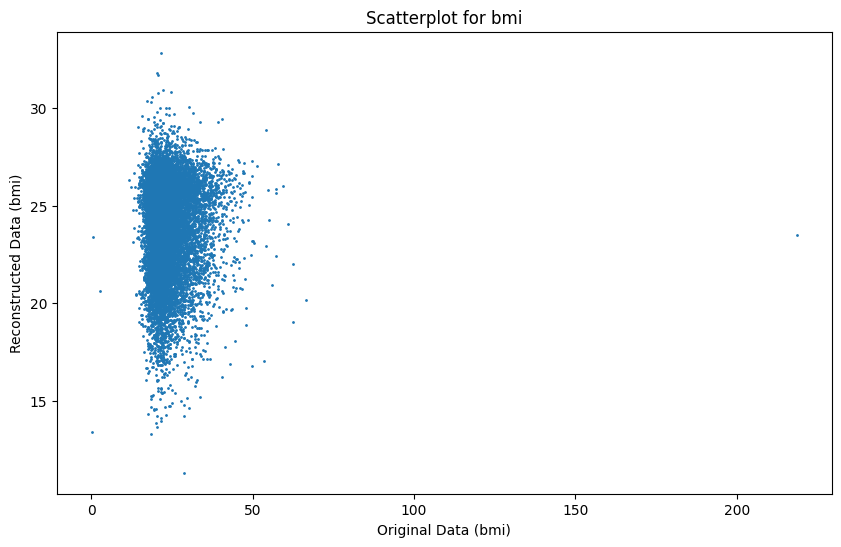

bmipct


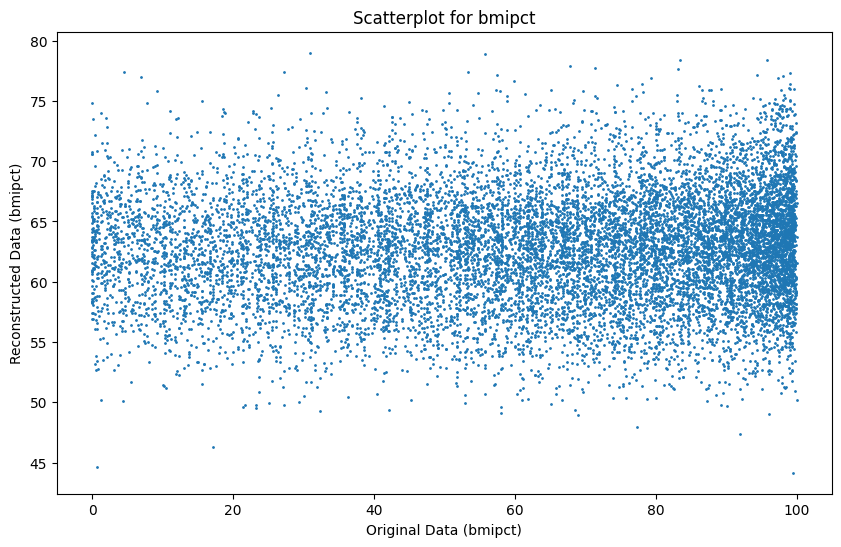

In [53]:
def create_scatterplot_for_numeric(original_df, predicted_df, numeric_attr):
  plt.figure(figsize=(10, 6))
  plt.scatter(original_df[numeric_attr], predicted_df[numeric_attr], s=1)
  plt.xlabel(f'Original Data ({numeric_attr})')
  plt.ylabel(f'Reconstructed Data ({numeric_attr})')
  plt.title(f'Scatterplot for {numeric_attr}')
  plt.show()  # Display the plot

for v in var_types.keys():
  if var_types[v] == 'numeric':
    print(v)
    create_scatterplot_for_numeric(project_data, tabular_from_predicted_vae, v)

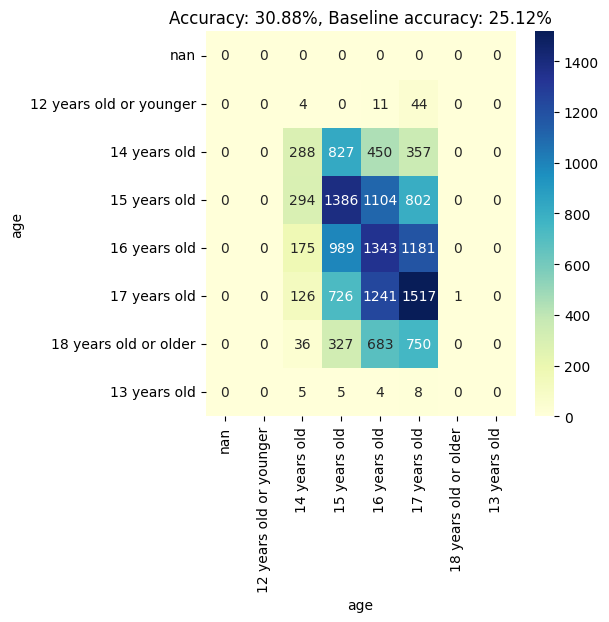

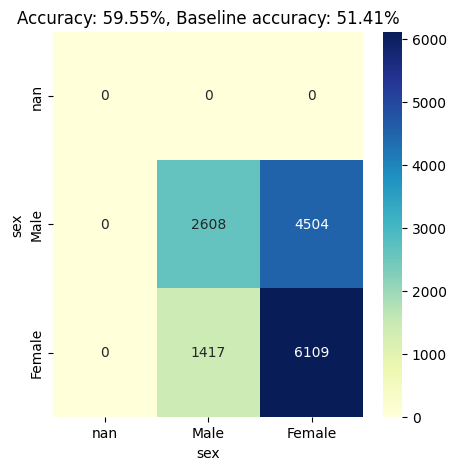

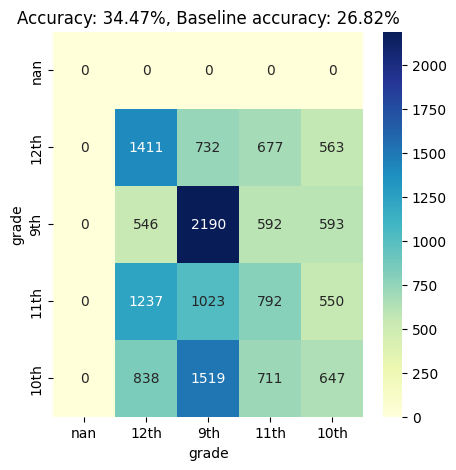

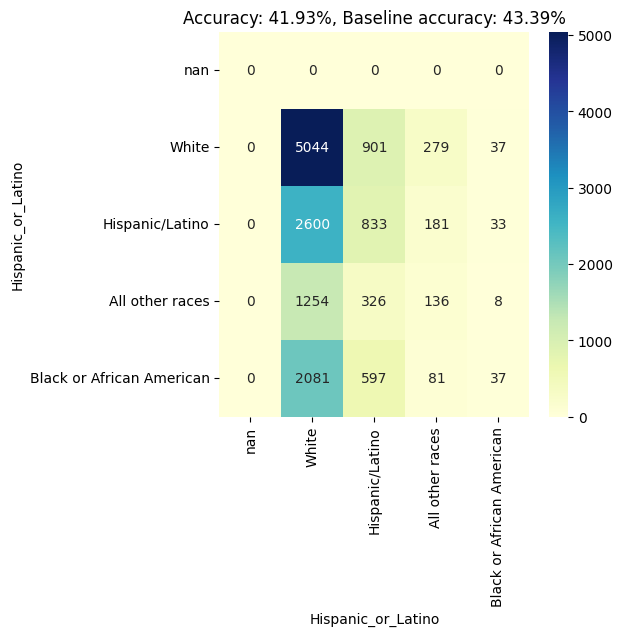

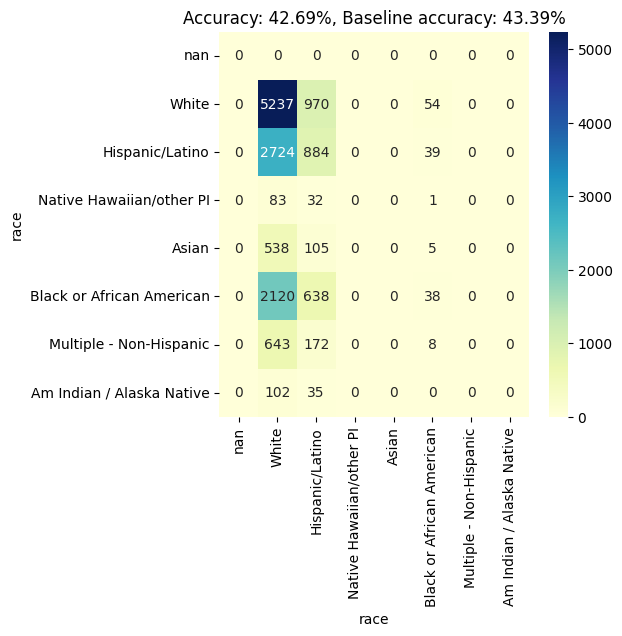

...

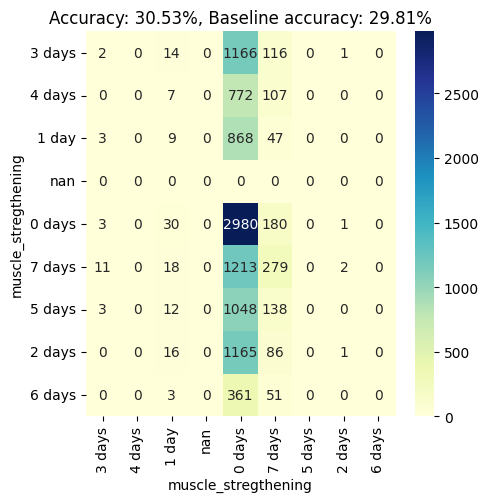

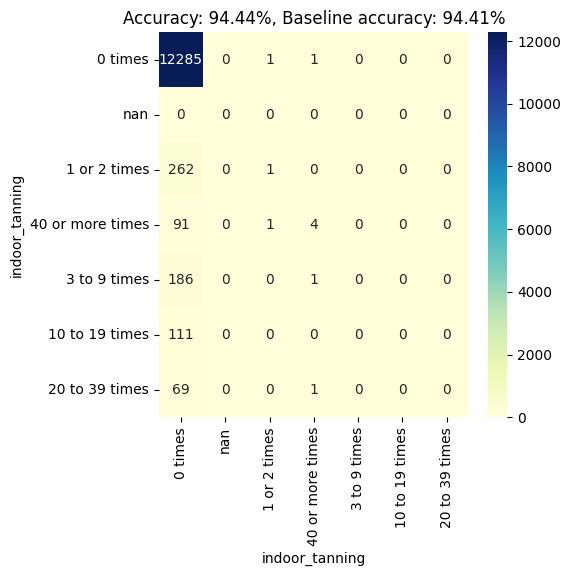

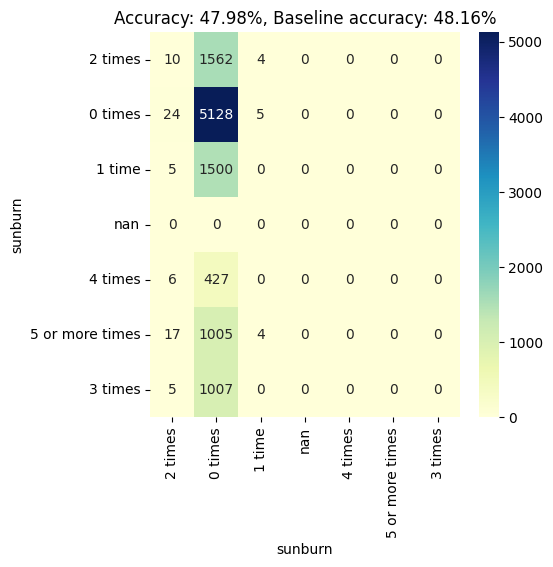

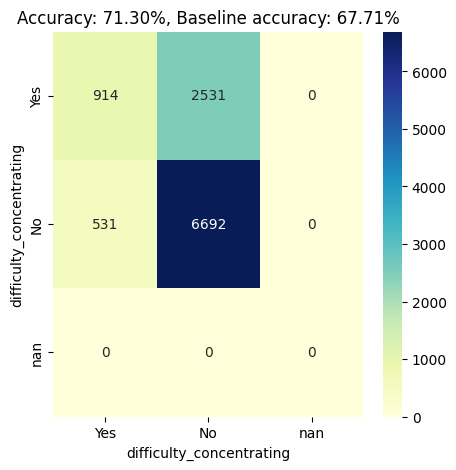

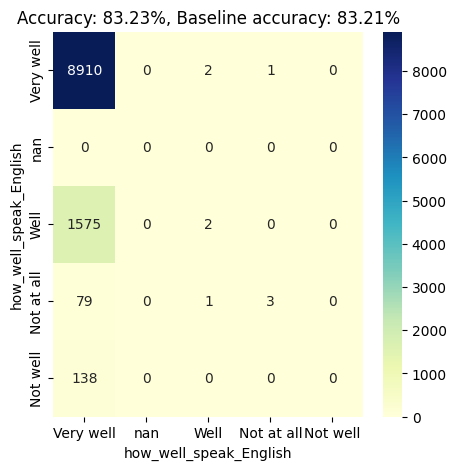

In [54]:
def create_scatterplot_for_categorical(original_df, predicted_df, categ_attr):
    all_categories = original_df[categ_attr].unique()

    confusion_matrix = pd.crosstab(original_df[categ_attr], predicted_df[categ_attr])

    confusion_matrix = confusion_matrix.reindex(index=all_categories, columns=all_categories, fill_value=0)

    diagonal_sum = np.trace(confusion_matrix.values)
    total_sum = np.sum(confusion_matrix.values)
    accuracy = diagonal_sum / total_sum * 100

    baseline_accuracy = original_df[categ_attr].value_counts().max() / total_sum * 100

    plt.figure(figsize=(5, 5))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Accuracy: {accuracy:.2f}%, Baseline accuracy: {baseline_accuracy:.2f}%")
    plt.show()


for v in var_types.keys():
  if var_types[v] == 'categorical':
    # print(v)
    create_scatterplot_for_categorical(project_data, tabular_from_predicted_vae, v)

In [56]:
def calculate_accuracy(original_df, predicted_df, categ_attr):
    all_categories = original_df[categ_attr].unique()

    confusion_matrix = pd.crosstab(original_df[categ_attr], predicted_df[categ_attr])

    confusion_matrix = confusion_matrix.reindex(index=all_categories, columns=all_categories, fill_value=0)

    diagonal_sum = np.trace(confusion_matrix.values)
    total_sum = np.sum(confusion_matrix.values)
    accuracy = diagonal_sum / total_sum * 100

    baseline_accuracy = original_df[categ_attr].value_counts().max() / total_sum * 100

    return accuracy, baseline_accuracy

In [57]:
avg_accuracy = 0
avg_baseline_accuracy = 0
count = 0

for v in var_types.keys():
    if var_types[v] == 'categorical':
        accuracy, baseline_accuracy = calculate_accuracy(project_data, tabular_from_predicted_vae, v)
        avg_accuracy += accuracy
        avg_baseline_accuracy += baseline_accuracy
        count += 1

avg_accuracy /= count
avg_baseline_accuracy /= count

print(f"Average Accuracy: {avg_accuracy:.2f}%")
print(f"Average Baseline Accuracy: {avg_baseline_accuracy:.2f}%")

Average Accuracy: 71.27%
Average Baseline Accuracy: 67.24%


Now that we have filled in the original dataset with the most likely values for their missing values, we run the Autoencoder on the filled vectorized dataset.

In [59]:
predicted = pd.DataFrame(model.predict(filled))
predicted.columns = filled.columns
predicted

462/462 [==============================] - 2s 3ms/step


,weight,stheight,stweight,bmi,bmipct,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,...,sunburn__2 times,sunburn__3 times,sunburn__4 times,sunburn__5 or more times,difficulty_concentrating__No,difficulty_concentrating__Yes,how_well_speak_English__Not at all,how_well_speak_English__Not well,how_well_speak_English__Very well,how_well_speak_English__Well
0,0.195940,0.587383,0.303695,0.108749,0.656014,0.004342,0.000399,0.004700,0.125434,0.287198,...,0.065132,0.022069,-0.006557,0.031244,0.674547,0.240736,-0.001807,0.013335,0.762406,0.142273
1,0.263337,0.454057,0.275584,0.122809,0.673284,-0.000876,0.009795,0.213273,0.291144,0.261416,...,0.122521,0.075502,0.039061,0.075076,0.230557,0.605510,0.000740,0.030803,0.684442,0.148739
2,0.205978,0.414373,0.250520,0.110779,0.653784,0.006186,-0.003660,-0.008078,0.131690,0.287244,...,0.118993,0.077814,0.061824,0.083983,0.344634,0.509776,0.004760,0.007051,0.718327,0.132396
3,0.302605,0.658366,0.323913,0.101454,0.611447,0.007518,-0.004720,-0.007744,0.102033,0.210764,...,0.200127,0.123818,0.049946,0.230163,0.678813,0.312103,0.007126,-0.009364,0.867371,0.120024
4,0.281063,0.454114,0.248274,0.115395,0.623534,-0.007376,0.012458,0.249511,0.327658,0.224280,...,0.128449,0.088912,0.034333,0.080152,0.295881,0.506447,0.001522,0.025514,0.694921,0.111986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14760,0.114345,0.537631,0.282137,0.103367,0.647649,0.015887,0.009070,0.239337,0.269693,0.191635,...,0.051841,0.004565,0.015928,0.002771,0.062070,0.020613,-0.002328,0.001221,0.085363,0.001699
14761,0.391164,0.741739,0.429419,0.121699,0.424226,-0.027101,-0.002514,0.056669,0.055817,0.611357,...,0.111264,0.255887,0.149168,0.435657,0.528368,0.562337,0.232911,0.088795,0.743629,-0.124523
14762,0.344380,0.670679,0.388659,0.117144,0.483297,-0.016611,-0.001717,0.076165,0.104873,0.504760,...,0.100955,0.184215,0.122476,0.332659,0.383197,0.451824,0.176328,0.089701,0.570264,-0.090589
14763,0.051522,0.514316,0.261946,0.108373,0.635011,-0.000254,0.034823,0.282097,0.297876,0.238601,...,0.010889,-0.005721,-0.009699,-0.006203,-0.028498,0.022835,-0.000998,-0.005715,0.002271,0.004608


In [60]:
tabular_from_predicted = vectorizer.tabularize_vector(predicted)

## Visualization of the original vs reconstructed

weight


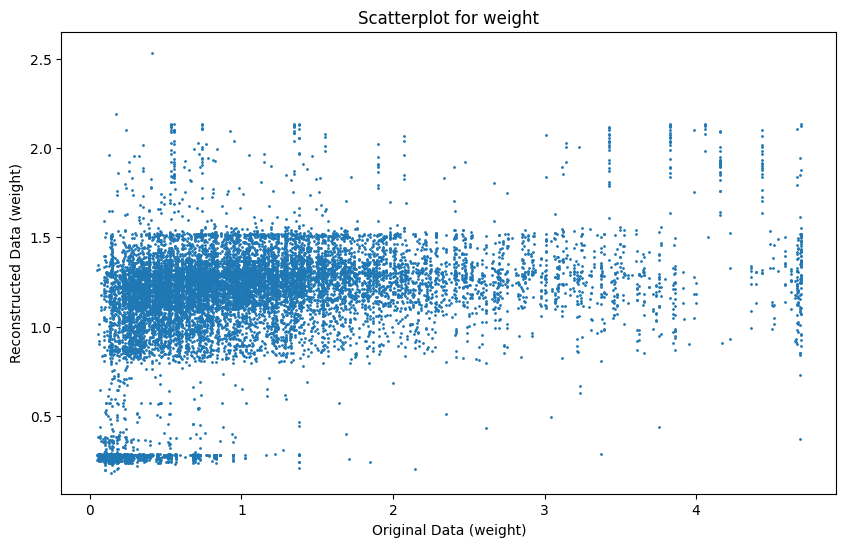

stheight


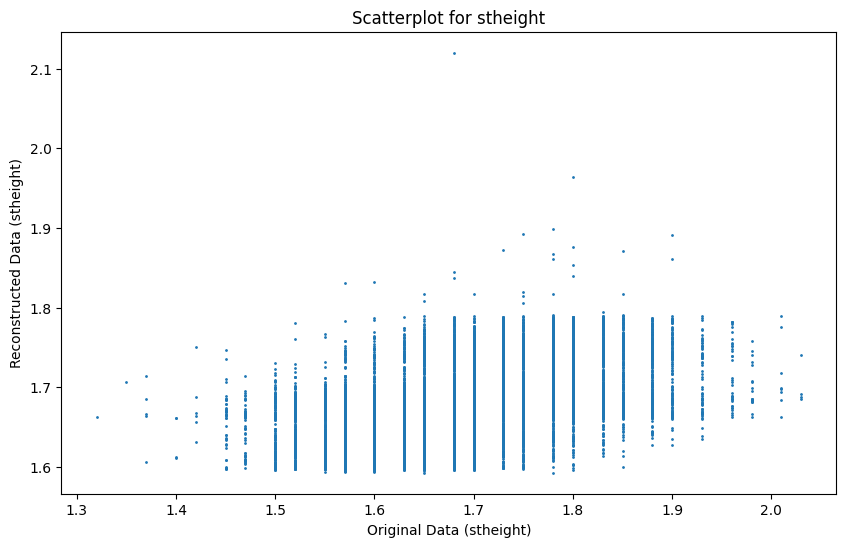

stweight


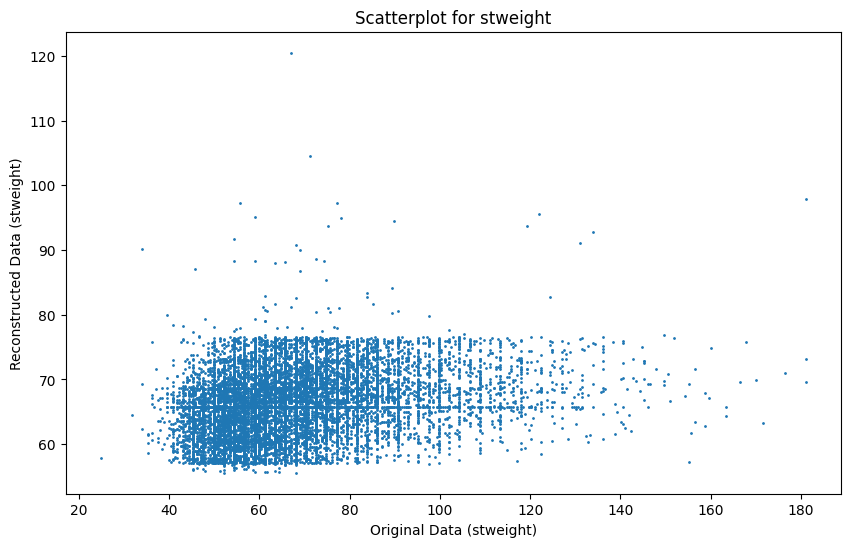

bmi


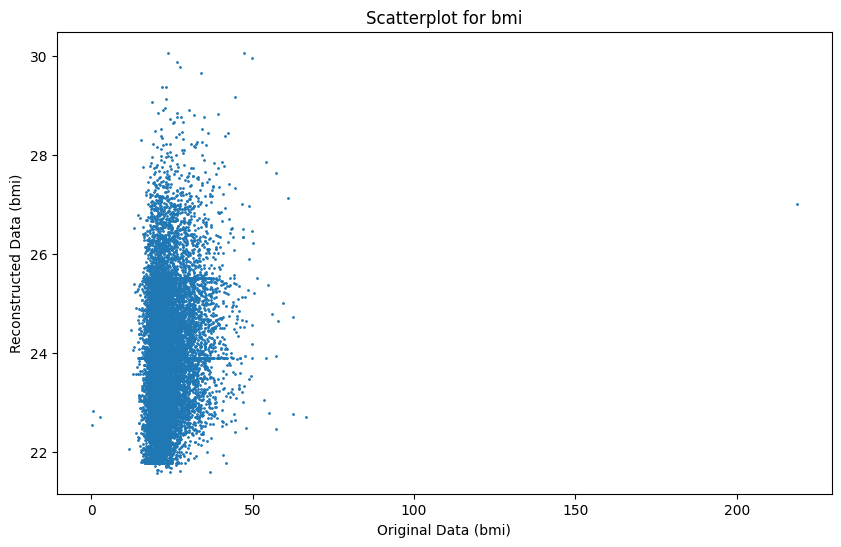

bmipct


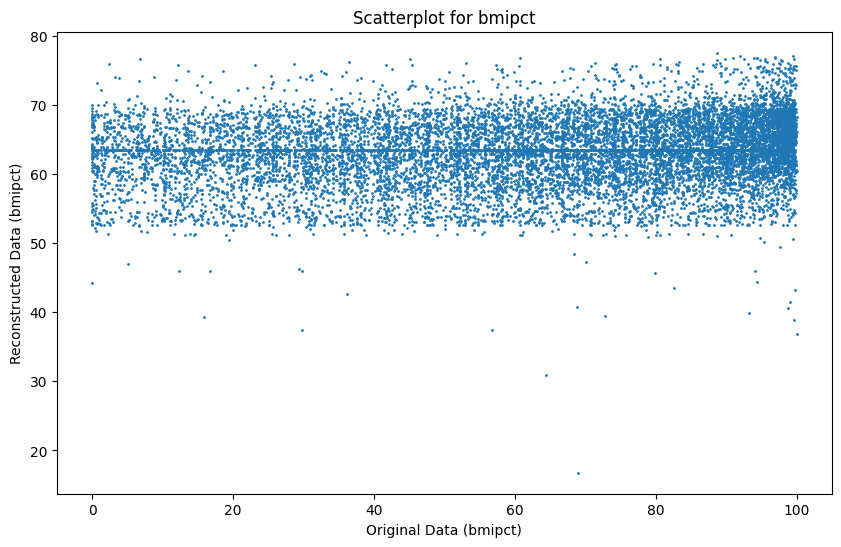

In [61]:
import matplotlib.pyplot as plt

def create_scatterplot_for_numeric(original_df, predicted_df, numeric_attr):
  plt.figure(figsize=(10, 6))  # Create a new figure with a particular size
  plt.scatter(original_df[numeric_attr], predicted_df[numeric_attr], s=1)  # Create a scatterplot
  plt.xlabel(f'Original Data ({numeric_attr})')  # Set the x-axis label
  plt.ylabel(f'Reconstructed Data ({numeric_attr})')  # Set the y-axis label
  plt.title(f'Scatterplot for {numeric_attr}')  # Set the plot title
  plt.show()  # Display the plot

for v in var_types.keys():
  if var_types[v] == 'numeric':
    print(v)
    create_scatterplot_for_numeric(project_data, tabular_from_predicted, v)



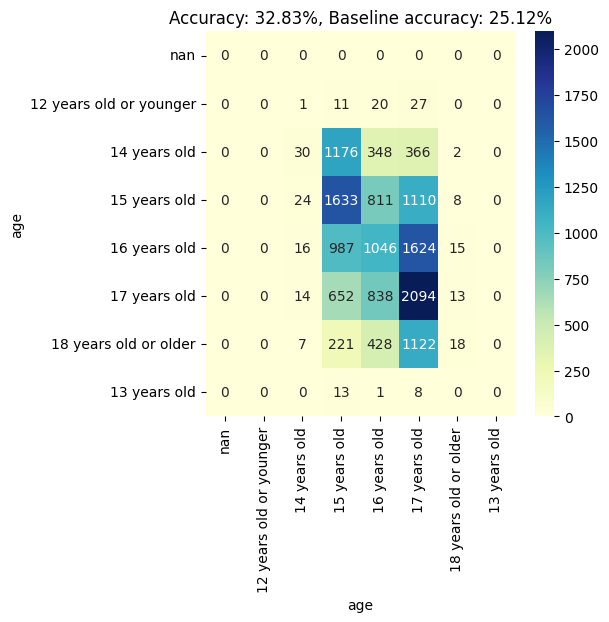

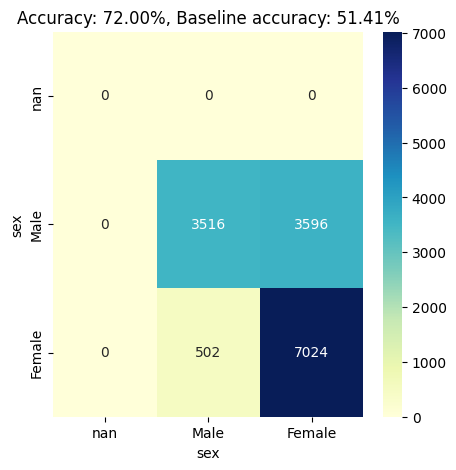

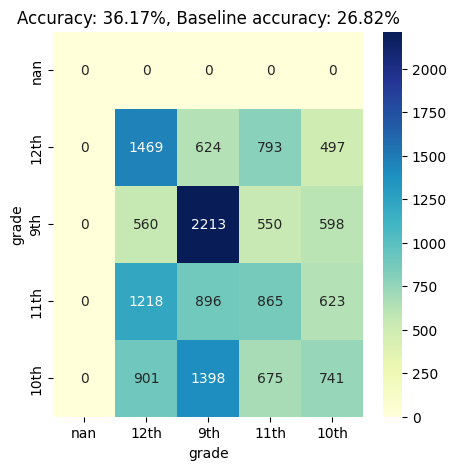

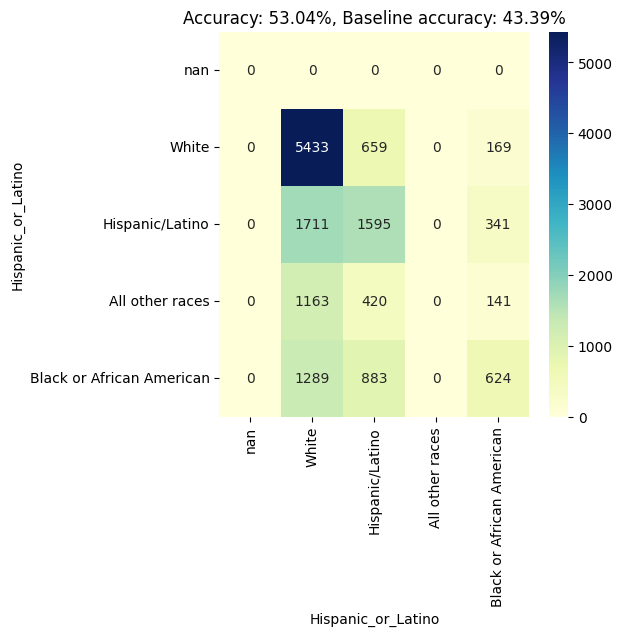

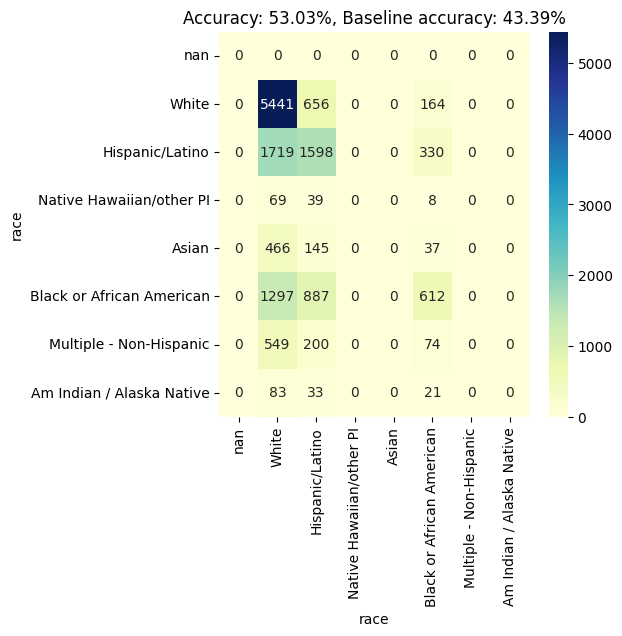

...

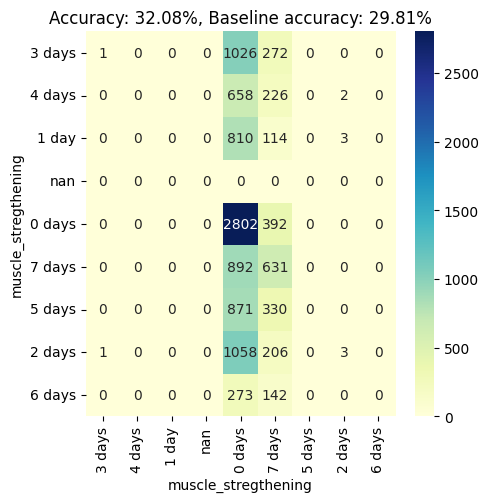

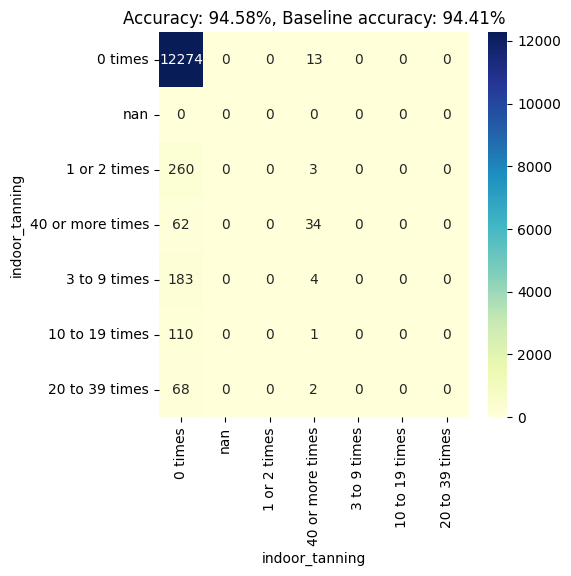

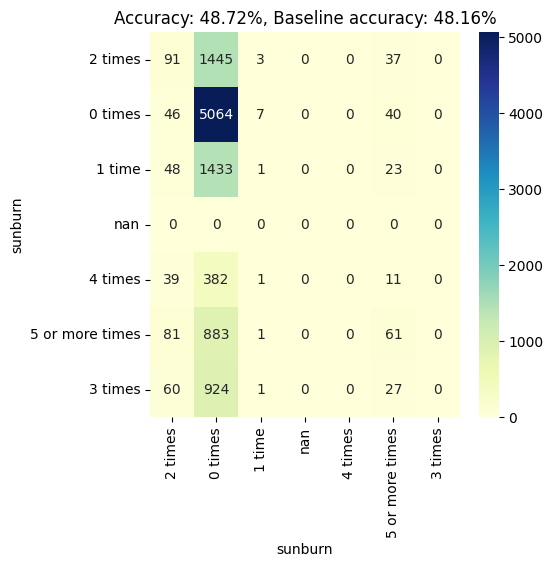

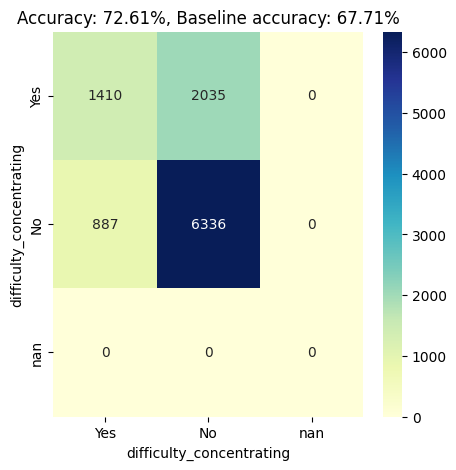

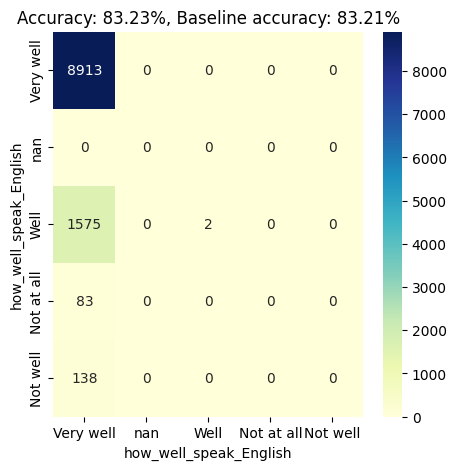

In [62]:
import matplotlib.pyplot as plt

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def create_scatterplot_for_categorical(original_df, predicted_df, categ_attr):
    # Create a list of all unique categories present in the original data
    all_categories = original_df[categ_attr].unique()

    # Create the confusion matrix using crosstab
    confusion_matrix = pd.crosstab(original_df[categ_attr], predicted_df[categ_attr])

    # Reindex the confusion matrix to include all categories in the original data
    confusion_matrix = confusion_matrix.reindex(index=all_categories, columns=all_categories, fill_value=0)

    # Calculate accuracy
    diagonal_sum = np.trace(confusion_matrix.values)
    total_sum = np.sum(confusion_matrix.values)
    accuracy = diagonal_sum / total_sum * 100

    # Calculate baseline accuracy
    baseline_accuracy = original_df[categ_attr].value_counts().max() / total_sum * 100

    plt.figure(figsize=(5, 5))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Accuracy: {accuracy:.2f}%, Baseline accuracy: {baseline_accuracy:.2f}%")
    plt.show()


for v in var_types.keys():
  if var_types[v] == 'categorical':
    # print(v)
    create_scatterplot_for_categorical(project_data, tabular_from_predicted, v)



In [64]:
avg_accuracy = 0
avg_baseline_accuracy = 0
count = 0

for v in var_types.keys():
    if var_types[v] == 'categorical':
        accuracy, baseline_accuracy = calculate_accuracy(project_data, tabular_from_predicted, v)
        avg_accuracy += accuracy
        avg_baseline_accuracy += baseline_accuracy
        count += 1

avg_accuracy /= count
avg_baseline_accuracy /= count

print(f"Average Accuracy: {avg_accuracy:.2f}%")
print(f"Average Baseline Accuracy: {avg_baseline_accuracy:.2f}%")

Average Accuracy: 73.50%
Average Baseline Accuracy: 67.24%


## Examine Training Output Statistics

Visualize the empirical distribution function of the latent representation obtained from the encoder model.

In [ ]:
model.predict(filled)[0,:]

Assess the quality of the autoencoder's reconstruction by calculating the Mean Absolute Error (MAE) between the reconstructed data and the original data.

462/462 [==============================] - 1s 2ms/step


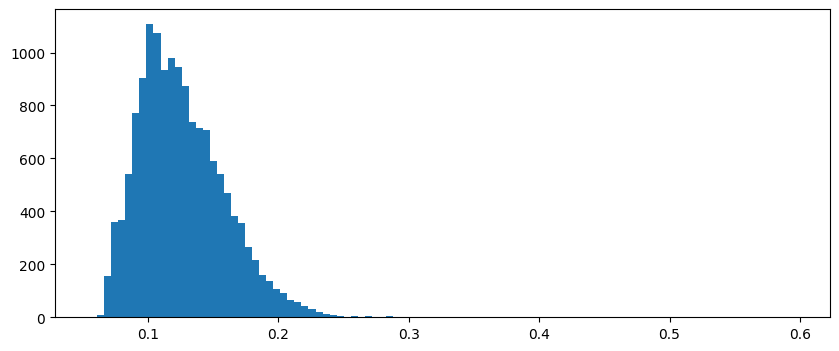

In [20]:
plt.figure(figsize=(10, 4))
# reconstruct the original data
normal_reconstructions = model.predict(filled)
# compute the Mean Absolute Error between the reconstructed data and the original data
normal_loss = tf.losses.mae(normal_reconstructions,filled)
plt.hist(normal_loss, bins=100)
plt.show()

The threshold value based on the mean and standard deviation of the reconstruction error. This threshold provides a reference point for distinguishing between normal reconstruction errors and potential outliers.

In [21]:
threshold = np.mean(normal_loss) + 2*np.std(normal_loss)
print(threshold)

0.19245672819298165


Visualize the distribution of the reconstruction errors and highlight the threshold for identifying outliers in the reconstruction error.

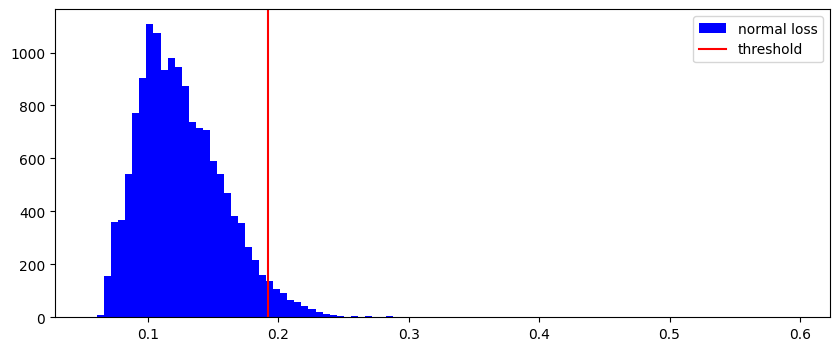

In [22]:
plt.figure(figsize=(10, 4))
plt.hist(normal_loss, bins=100, color='b', label="normal loss")
# add a vertical line to the plot at the position of the threshold value
plt.axvline(threshold, color='r', label="threshold")
plt.legend()
plt.show()

In [23]:
normal_loss

<tf.Tensor: shape=(14765,), dtype=float64, numpy=
array([0.14415757, 0.12784596, 0.1752039 , ..., 0.19872842, 0.08957255,
       0.15860181])>

In [24]:
reconstructed_error_df = pd.DataFrame()
reconstructed_error_df['Reconstructed_Error'] = normal_loss


# Create a GCS filesystem object
fs = gcsfs.GCSFileSystem(project='autoencoder-census')

# Define the path to the file on GCS
gcs_path = "gs://autoencoder_census_models/data_with_reconstructed_errors.csv"

# Save the DataFrame to GCS
with fs.open(gcs_path, 'w') as gcs_file:
    reconstructed_error_df.to_csv(gcs_file)

reconstructed_error_df.head()

,Reconstructed_Error
0,0.144158
1,0.127846
2,0.175204
3,0.186443
4,0.117887


Obtain the indices in descending order of the reconstruction errors.

In [25]:
sorted_indices = np.argsort(normal_loss)[::-1]

Identify and extract a subset of samples from the original dataset that have the 100 highest reconstruction errors and have reconstruction errors exceeding the threshold value.

In [26]:

k = 100  # Number of samples to select
samples_with_high_error = vectorized_df.iloc[sorted_indices[:k]]
samples_with_high_error.head()

,weight,stheight,stweight,bmi,bmipct,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,...,sunburn__2 times,sunburn__3 times,sunburn__4 times,sunburn__5 or more times,difficulty_concentrating__No,difficulty_concentrating__Yes,how_well_speak_English__Not at all,how_well_speak_English__Not well,how_well_speak_English__Very well,how_well_speak_English__Well
7056,0.079344,0.507042,0.270315,0.107868,0.690107,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4424,0.027710,0.676056,0.296527,0.099609,0.643493,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3591,0.155289,0.816901,0.334273,0.096763,0.566970,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
589,0.143844,0.605634,0.197642,0.082367,0.297289,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
3139,0.051354,0.464789,0.316842,0.124080,0.940682,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [27]:
# Find indices of tuples with reconstruction values larger than the threshold
anomaly_indices = np.where(normal_loss > threshold)[0]

# Select the corresponding tuples from the original data
anomaly_tuples = vectorized_df.iloc[anomaly_indices]

# Print the anomaly tuples
anomaly_tuples.head()


,weight,stheight,stweight,bmi,bmipct,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,...,sunburn__2 times,sunburn__3 times,sunburn__4 times,sunburn__5 or more times,difficulty_concentrating__No,difficulty_concentrating__Yes,how_well_speak_English__Not at all,how_well_speak_English__Not well,how_well_speak_English__Very well,how_well_speak_English__Well
7,0.356232,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
12,0.211872,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
15,0.043351,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
29,0.638196,NaN,NaN,0.157129,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
31,0.131839,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [28]:
anomaly_tuples.shape

(554, 563)

Reconstruct the transformed data using the trained autoencoder model and get the combined dataframe of the original transformed data with its reconstructed version.

In [29]:

reconstructed_data = model.predict(filled)

reconstructed_df = pd.DataFrame(reconstructed_data, columns=vectorized_df.columns)

combined_df = pd.concat([vectorized_df, reconstructed_df], axis=1)
combined_df.head()

462/462 [==============================] - 1s 2ms/step


,weight,stheight,stweight,bmi,bmipct,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,...,sunburn__2 times,sunburn__3 times,sunburn__4 times,sunburn__5 or more times,difficulty_concentrating__No,difficulty_concentrating__Yes,how_well_speak_English__Not at all,how_well_speak_English__Not well,how_well_speak_English__Very well,how_well_speak_English__Well
0,0.508875,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.065132,0.022069,-0.006557,0.031244,0.674547,0.240736,-0.001807,0.013335,0.762406,0.142273
1,0.347927,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.122521,0.075502,0.039061,0.075076,0.230557,0.605510,0.000740,0.030803,0.684442,0.148739
2,0.142144,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.118993,0.077814,0.061824,0.083983,0.344634,0.509776,0.004760,0.007051,0.718327,0.132396
3,0.161873,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.200127,0.123818,0.049946,0.230163,0.678813,0.312103,0.007126,-0.009364,0.867371,0.120024
4,0.415955,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.128449,0.088912,0.034333,0.080152,0.295881,0.506447,0.001522,0.025514,0.694921,0.111986


In [30]:
reconstructed_data1 = model.predict(vectorized_df)
reconstructed_df1 = pd.DataFrame(reconstructed_data, columns=vectorized_df.columns)
columns_to_modify = ["weight","stheight","stweight","bmi","bmipct"]
vectorized_df[columns_to_modify] = vectorized_df[columns_to_modify].replace(0, np.nan)

reconstructed_df1.head()

462/462 [==============================] - 1s 2ms/step


,weight,stheight,stweight,bmi,bmipct,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,...,sunburn__2 times,sunburn__3 times,sunburn__4 times,sunburn__5 or more times,difficulty_concentrating__No,difficulty_concentrating__Yes,how_well_speak_English__Not at all,how_well_speak_English__Not well,how_well_speak_English__Very well,how_well_speak_English__Well
0,0.195940,0.587383,0.303695,0.108749,0.656014,0.004342,0.000399,0.004700,0.125434,0.287198,...,0.065132,0.022069,-0.006557,0.031244,0.674547,0.240736,-0.001807,0.013335,0.762406,0.142273
1,0.263337,0.454057,0.275584,0.122809,0.673284,-0.000876,0.009795,0.213273,0.291144,0.261416,...,0.122521,0.075502,0.039061,0.075076,0.230557,0.605510,0.000740,0.030803,0.684442,0.148739
2,0.205978,0.414373,0.250520,0.110779,0.653784,0.006186,-0.003660,-0.008078,0.131690,0.287244,...,0.118993,0.077814,0.061824,0.083983,0.344634,0.509776,0.004760,0.007051,0.718327,0.132396
3,0.302605,0.658366,0.323913,0.101454,0.611447,0.007518,-0.004720,-0.007744,0.102033,0.210764,...,0.200127,0.123818,0.049946,0.230163,0.678813,0.312103,0.007126,-0.009364,0.867371,0.120024
4,0.281063,0.454114,0.248274,0.115395,0.623534,-0.007376,0.012458,0.249511,0.327658,0.224280,...,0.128449,0.088912,0.034333,0.080152,0.295881,0.506447,0.001522,0.025514,0.694921,0.111986


Calculate the cost standardization and map reconstructed binary values to categories.

\#1 approach for getting cost values:

In [31]:
numeric_vars = ["weight","stheight","stweight","bmi","bmipct"]
categorical_vars = [c for c in vectorized_df.columns.values if c not in numeric_vars]

cost = {}
mapped_categories = {}

for column in vectorized_df[categorical_vars]:
  probability = vectorized_df[column].mean(axis=0)
  cost_value = np.where(probability != 0, (1 / probability) * 0.01, np.inf)

  cost[column] = cost_value

for column, cost in cost.items():
    # Map the reconstructed values to categories based on the threshold
    mapped_categories[column] = (reconstructed_df[column] > cost).astype(int)

In [32]:
numeric_vars = ['weight', 'stheight', 'stweight', 'bmi', 'bmipct']
categorical_vars = [c for c in vectorized_df.columns.values if c not in numeric_vars]

cost1 = {}
mapped_categories1 = {}

for column in vectorized_df[categorical_vars]:
  probability = vectorized_df[column].mean(axis=0)
  cost_value = np.where(probability != 0, (1 / probability) * 0.01, np.inf)

  cost1[column] = cost_value

for column, cost in cost1.items():
    # Map the reconstructed values to categories based on the threshold
    mapped_categories1[column] = (reconstructed_df1[column] > cost).astype(int)

In [33]:
reconstructed_binary_df = pd.DataFrame(mapped_categories1)

selected_columns = reconstructed_df[['weight', 'stheight', 'stweight', 'bmi', 'bmipct']]
reconstructed_binary_df = pd.concat([reconstructed_binary_df, selected_columns], axis=1)

In [34]:
reconstructed_reverse_df = vectorizer.tabularize_vector(reconstructed_binary_df)

In [35]:
numeric_columns = ['weight', 'stheight', 'stweight', 'bmi', 'bmipct']
numeric_mae = {}

for column in numeric_columns:
    mae = mean_absolute_error(filled[column], reconstructed_reverse_df[column])
    numeric_mae[column] = mae

print("Numeric MAE:")
for column, mae in numeric_mae.items():
    print(f"{column}: {mae}")

categorical_columns = [c for c in project_data.columns.values if c not in numeric_columns]
categorical_accuracy = (project_data[categorical_columns] == reconstructed_reverse_df[categorical_columns]).mean()
print(f"Categorical Accuracy: {categorical_accuracy}")

Numeric MAE:
weight: 0.8680998934937073
stheight: 1.161262593413374
stweight: 66.25230096032915
bmi: 23.94450435889496
bmipct: 62.6140007481726
Categorical Accuracy: age                         0.177040
sex                         0.529428
grade                       0.251609
Hispanic_or_Latino          0.145953
race                        0.225737
                              ...   
muscle_stregthening         0.216390
indoor_tanning              0.831358
sunburn                     0.348188
difficulty_concentrating    0.489401
how_well_speak_English      0.603590
Length: 103, dtype: float64


\#2 approach for getting cost values:

In [36]:
from matplotlib.offsetbox import TransformedBbox
numeric_vars = ["weight","stheight","stweight","bmi","bmipct"]
categorical_vars = [c for c in vectorized_df.columns.values if c not in numeric_vars]

mapped_categories_z_score = {}

cost_df = pd.DataFrame()

for column in vectorized_df[categorical_vars]:
    probability = vectorized_df[column].mean(axis=0)
    std = vectorized_df[column].std(axis=0)

    cost_values = []

    for index, value in vectorized_df[column].items():
        cost_value = (value - probability) / std if std != 0 else np.inf
        cost_values.append(cost_value)

    cost_df[column] = cost_values

    cost_df.head()

for column, cost in cost_df.items():
    lower_bound = vectorized_df[column].mean(axis=0) - cost
    upper_bound = vectorized_df[column].mean(axis=0) + cost
    mapped_values = ((reconstructed_df[column] > lower_bound) & (reconstructed_df[column] < upper_bound)).astype(int)
    mapped_categories_z_score[column] = mapped_values

<ipython-input-36-f5c986df8fe6>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cost_df[column] = cost_values
<ipython-input-36-f5c986df8fe6>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cost_df[column] = cost_values
<ipython-input-36-f5c986df8fe6>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy(

In [37]:
from matplotlib.offsetbox import TransformedBbox
numeric_vars = ["weight","stheight","stweight","bmi","bmipct"]
categorical_vars = [c for c in vectorized_df.columns.values if c not in numeric_vars]

mapped_categories2 = {}

cost_df2 = pd.DataFrame()

for column in vectorized_df[categorical_vars]:
    probability = vectorized_df[column].mean(axis=0)
    std = vectorized_df[column].std(axis=0)

    cost_values = []

    for index, value in vectorized_df[column].items():
        cost_value = (value - probability) / std if std != 0 else np.inf
        cost_values.append(cost_value)

    cost_df2[column] = cost_values

    cost_df2.head()

for column, cost in cost_df2.items():
    lower_bound = vectorized_df[column].mean(axis=0) - cost
    mapped_values = (reconstructed_df1[column] > lower_bound).astype(int)
    mapped_categories2[column] = mapped_values

<ipython-input-37-971bbb2e82f6>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cost_df2[column] = cost_values
<ipython-input-37-971bbb2e82f6>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cost_df2[column] = cost_values
<ipython-input-37-971bbb2e82f6>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.cop

In [38]:
reconstructed_binary_df2 = pd.DataFrame(mapped_categories2)
reconstructed_binary_df2 = pd.concat([reconstructed_binary_df2, selected_columns], axis=1)

In [39]:
reconstructed_reverse_df2 = vectorizer.tabularize_vector(reconstructed_binary_df2)

In [40]:
for column in numeric_columns:
    mae = mean_absolute_error(filled[column], reconstructed_reverse_df2[column])
    numeric_mae[column] = mae

print("Numeric MAE:")
for column, mae in numeric_mae.items():
    print(f"{column}: {mae}")

categorical_accuracy = (project_data[categorical_columns] == reconstructed_reverse_df2[categorical_columns]).mean()
print(f"Categorical Accuracy: {categorical_accuracy}")

Numeric MAE:
weight: 0.8680998934937073
stheight: 1.161262593413374
stweight: 66.25230096032915
bmi: 23.94450435889496
bmipct: 62.6140007481726
Categorical Accuracy: age                         0.988283
sex                         0.991399
grade                       0.990247
Hispanic_or_Latino          0.977176
race                        0.977176
                              ...   
muscle_stregthening         0.725567
indoor_tanning              0.874704
sunburn                     0.725296
difficulty_concentrating    0.722519
how_well_speak_English      0.723129
Length: 103, dtype: float64


In [41]:
nan_rows_original = original_df[numeric_columns].isna().any(axis=1)
original_df_dropped = original_df.dropna(subset=numeric_columns)

dropped_indices = original_df_dropped.index

reconstructed_df_dropped2 = reconstructed_df.loc[dropped_indices]

for column in numeric_columns:
    mae = mean_absolute_error(original_df_dropped[column], reconstructed_df_dropped2[column])
    numeric_mae[column] = mae

print("Numeric MAE:")
for column, mae in numeric_mae.items():
    print(f"{column}: {mae}")

Numeric MAE:
weight: 0.7858274354862591
stheight: 1.1823273475363647
stweight: 67.42149705428784
bmi: 23.511133455658253
bmipct: 62.894526882531


**#3**

Group columns with similar names, normalize values within each group, and assign predicted values (0 or 1) by selecting the column with the maximum value within each group.

In [42]:
import re

column_groups = {}
categorical_df = reconstructed_df1[categorical_vars]

for column in categorical_df.columns:
    common_name = column.rsplit('_', 1)[0]
    if common_name in column_groups:
        column_groups[common_name].append(column)
    else:
        column_groups[common_name] = [column]

normalized_df = categorical_df.copy()

for group in column_groups.values():
    column_sum = categorical_df[group].sum(axis=0)
    normalized_values = column_sum / column_sum.sum()
    normalized_df[group] = categorical_df[group] / normalized_values

predicted_df = pd.DataFrame()

for group in column_groups.values():
  df = normalized_df [group]

  for index, row in df.iterrows():
    max_value = row.max()
    max_column = row.idxmax()
    df.loc[index, group] = 0
    df.at[index, max_column] = 1

  predicted_df = pd.concat([predicted_df, df], axis = 1)

predicted_df = predicted_df.reset_index(drop=True)

流式输出内容被截断，只能显示最后 5000 行内容。
<ipython-input-42-d951c831e6a3>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, group] = 0
<ipython-input-42-d951c831e6a3>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, group] = 0
<ipython-input-42-d951c831e6a3>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, group] = 0
<ipython-input-42-d951c831e6a3>:28: SettingWithCopyWarning: 
A value is trying to be set on

KeyboardInterrupt: ignored

In [ ]:
reconstructed_binary_df3 = pd.concat([predicted_df, selected_columns], axis=1)
reconstructed_reverse_df3 = vectorizer.tabularize_vector(reconstructed_binary_df3)

In [ ]:
for column in numeric_columns:
    mae = mean_absolute_error(filled[column], reconstructed_reverse_df3[column])
    numeric_mae[column] = mae

print("Numeric MAE:")
for column, mae in numeric_mae.items():
    print(f"{column}: {mae}")

categorical_accuracy = (project_data[categorical_columns] == reconstructed_reverse_df3[categorical_columns]).mean()
print(f"Categorical Accuracy: {categorical_accuracy}")